In [1]:
# enabling 3rd party widgets
# from google.colab import output
# output.enable_custom_widget_manager()
# output.disable_custom_widget_manager()

# interactive 3D plot
# !pip install ipympl
# %matplotlib widget

In [2]:
import os
import math
from collections import OrderedDict
import numpy as np
import matplotlib.pyplot as plt
from scipy import linalg

import time as time
import platform as platform

import tensorflow as tf
from tensorflow.keras import layers, losses
from tensorflow.keras.models import Model
from tensorflow.keras import backend as K
from tensorflow.keras.regularizers import L2
import h5py

tf.keras.backend.set_floatx('float32')

In [3]:
colab_flag = False

FTYPE = np.float32
ITYPE = np.int32

strategy = None
# strategy = tf.distribute.MirroredStrategy()

In [4]:
current_sys = platform.system()

if current_sys == 'Windows':
    dir_sep = '\\'
else:
    dir_sep = '/'

In [5]:
if colab_flag == True:
    from google.colab import drive
    drive.mount('/content/drive')
    os.chdir('/content/drive/MyDrive/Github/MLROM/KS/')

In [6]:
print(os.getcwd())

/home/rkaushik/Documents/Thesis/MLROM/new_lorenz


In [7]:
from tools.misc_tools import mytimecallback, SaveLosses, plot_losses, readAndReturnLossHistories, plot_reconstructed_data, plot_latent_states 
from tools.ae_v1 import Autoencoder

In [8]:
behaviour = 'initialiseAndTrainFromScratch'
# behaviour = 'loadCheckpointAndContinueTraining'
# behaviour = 'loadFinalNetAndPlot'

In [9]:
# setting seed for PRNGs
if behaviour == 'initialiseAndTrainFromScratch':
    prng_seed = 42
    np.random.seed(prng_seed)
    tf.random.set_seed(prng_seed)

In [10]:
gpus = tf.config.list_physical_devices('GPU')
print(gpus)

if colab_flag == False:
    if strategy is None:
        if gpus:
            gpu_to_use = 0
            tf.config.set_visible_devices(gpus[gpu_to_use], 'GPU')
    logical_devices = tf.config.list_logical_devices('GPU')
    print(logical_devices)

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]
[LogicalDevice(name='/device:GPU:0', device_type='GPU')]


2023-03-06 14:59:36.048240: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-03-06 14:59:36.048710: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-03-06 14:59:36.097745: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-03-06 14:59:36.098165: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-03-06 14:59:36.098393: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from S

In [11]:
# print(tf.test.gpu_device_name())
print(tf.config.list_physical_devices())
print(tf.config.list_logical_devices())
print(tf.__version__)

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]
[LogicalDevice(name='/device:CPU:0', device_type='CPU'), LogicalDevice(name='/device:GPU:0', device_type='GPU')]
2.8.1


# KS System

In [12]:
# setting up params (and saving, if applicable)
from numpy import *

if behaviour == 'initialiseAndTrainFromScratch':
    # loading data directory
    data_dir_idx = '007'

    # making ae save directory
    dir_name_ae = os.getcwd() + dir_sep + 'saved_ae'
    if not os.path.isdir(dir_name_ae):
        os.makedirs(dir_name_ae)

    counter = 0
    while True:
        dir_check = 'ae_' + str(counter).zfill(3)
        if os.path.isdir(dir_name_ae + dir_sep + dir_check):
            counter += 1
        else:
            break

    dir_name_ae = dir_name_ae + dir_sep + dir_check
    os.makedirs(dir_name_ae)
    os.makedirs(dir_name_ae+dir_sep+'plots')
else:
    # some paramaters
    dir_name_ae = os.getcwd()+'{ds}saved_ae{ds}ae_015'.format(ds=dir_sep)

    with open(dir_name_ae + dir_sep + 'ae_data.txt') as f:
        lines = f.readlines()

    params_dict = eval(''.join(lines))
    data_dir_idx = params_dict['data_dir_idx']
    normalizeforae_flag = params_dict['normalizeforae_flag']
    normalization_constant_arr_aedata = params_dict['normalization_constant_arr_aedata']
    if os.path.exists(dir_name_ae+dir_sep+'normalization_data.npz'):
        with np.load(dir_name_ae+dir_sep+'normalization_data.npz', allow_pickle=True) as fl:
            normalization_constant_arr_aedata = fl['normalization_constant_arr_aedata'][0]

print('dir_name_ae:', dir_name_ae)
# loading data
dir_name_data = os.getcwd() + dir_sep + 'saved_data' + dir_sep + 'data_' + data_dir_idx
    
with open(dir_name_data + dir_sep + 'sim_data_params.txt') as f:
    lines = f.readlines()
params_dict = eval(''.join(lines))
params_mat = params_dict['params_mat']
# init_state = params_dict['init_state']
t0 = params_dict['t0']
T = params_dict['T']
delta_t = params_dict['delta_t']
return_params_arr = params_dict['return_params_arr']
normalize_flag_ogdata = params_dict['normalize_flag']
print('normalize_flag_ogdata:', normalize_flag_ogdata)
alldata_withparams_flag = params_dict['alldata_withparams_flag']

with np.load(dir_name_data+dir_sep+'data.npz', allow_pickle=True) as fl:
    all_data = fl['all_data'].astype(FTYPE)
    boundary_idx_arr = fl['boundary_idx_arr']
    normalization_constant_arr_ogdata = fl['normalization_constant_arr'][0]
    initial_t0 = fl['initial_t0']
    init_state_mat = fl['init_state_mat']

    lyapunov_spectrum_mat = fl['lyapunov_spectrum_mat']

dir_name_ae: /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022
normalize_flag_ogdata: False


In [13]:
lyapunov_time_arr = np.empty(shape=lyapunov_spectrum_mat.shape[0], dtype=FTYPE)
for i in range(lyapunov_spectrum_mat.shape[0]):
    lyapunov_time_arr[i] = 1/lyapunov_spectrum_mat[i, 0]
    print('Case : {}, lyapunov exponent : {}, lyapunov time : {}s'.format(i+1, lyapunov_spectrum_mat[i, 0], lyapunov_time_arr[i]))

Case : 1, lyapunov exponent : 0.8462938033526849, lyapunov time : 1.1816227436065674s
Case : 2, lyapunov exponent : 0.9189013386531488, lyapunov time : 1.0882561206817627s
Case : 3, lyapunov exponent : 1.0555152061034634, lyapunov time : 0.9474046230316162s
Case : 4, lyapunov exponent : 0.8433583534181139, lyapunov time : 1.1857355833053589s
Case : 5, lyapunov exponent : 0.9162726624144278, lyapunov time : 1.0913782119750977s
Case : 6, lyapunov exponent : 1.1105547868334344, lyapunov time : 0.9004508256912231s
Case : 7, lyapunov exponent : 0.9808660331922562, lyapunov time : 1.0195071697235107s
Case : 8, lyapunov exponent : 1.1183123658225957, lyapunov time : 0.8942045569419861s
Case : 9, lyapunov exponent : 1.179518334536936, lyapunov time : 0.8478037118911743s
Case : 10, lyapunov exponent : 0.47442276309589326, lyapunov time : 2.1078245639801025s
Case : 11, lyapunov exponent : 0.9197463849291825, lyapunov time : 1.0872561931610107s
Case : 12, lyapunov exponent : 1.0491014276577122, l

In [14]:
def plot(
        boundary_idx_arr,
        delta_t,
        all_data,
        save_dir=None,
        ax_titles_list=None,
        plot_time=None,
    ):

    n = len(boundary_idx_arr)
    num_digits_n = int(np.log10(n)+1)

    # '''
    num_cols = 1
    num_rows = 1
    factor = 1
    # fig = plt.figure(figsize=(7.5*num_cols, 7.5*num_rows))

    
    prev_idx = 0
    for i in range(len(boundary_idx_arr)):
        next_idx = boundary_idx_arr[i]
        if plot_time != None:
            plot_idx = int((plot_time + 0.5*delta_t) // delta_t)
            next_idx = prev_idx + plot_idx
        fig = plt.figure(figsize=(factor*7.5*num_cols, factor*5.0*num_rows))
        N = next_idx - prev_idx
        input_time = np.arange(0, N)*delta_t

        ax_orig = fig.add_subplot(num_rows, num_cols, 1, projection ='3d')
        ax_orig.plot(all_data[prev_idx:next_idx, 0], all_data[prev_idx:next_idx, 1], all_data[prev_idx:next_idx, 2])
        ax_orig.title.set_text(r'Actual Data - [$\sigma$, $\rho$, $\beta$] = ' + np.array2string(all_data[next_idx-1, 3:], precision=2, separator=', '))
        ax_orig.set_xlabel('x_1')
        ax_orig.set_ylabel('x_2')
        ax_orig.set_zlabel('x_3')
        
        # ax.title.set_text(r'Latent States')
        if ax_titles_list is not None:
            ax_orig.title.set_text(ax_titles_list[i])
        else:
            ax_orig.title.set_text(r'Case '+str(i+1))

        if save_dir is not None:
            fig.savefig(save_dir+'/Case_'+str(i+1).zfill(num_digits_n)+'.png', dpi=300, bbox_inches='tight')
            fig.clear()
            plt.close()
        else:
            plt.show()
            print('')

        prev_idx = boundary_idx_arr[i]

    # '''

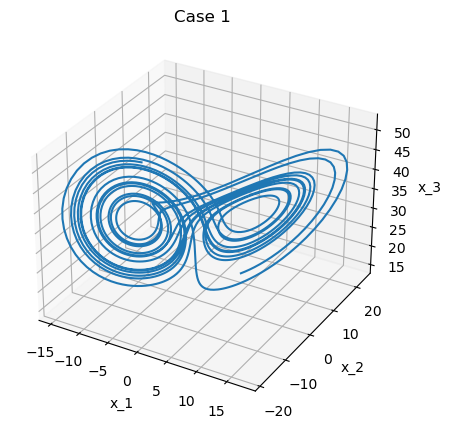

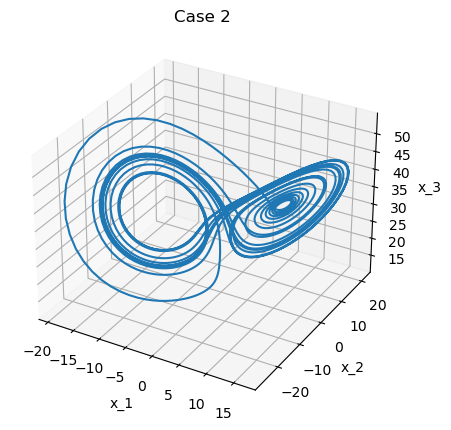

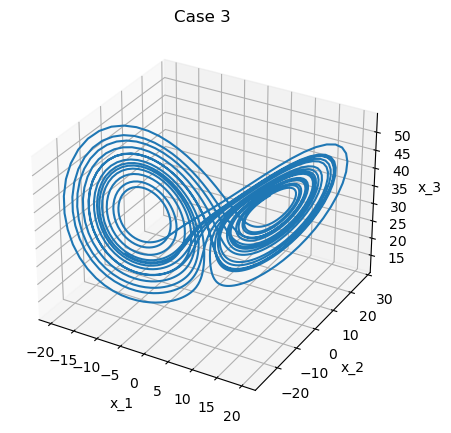

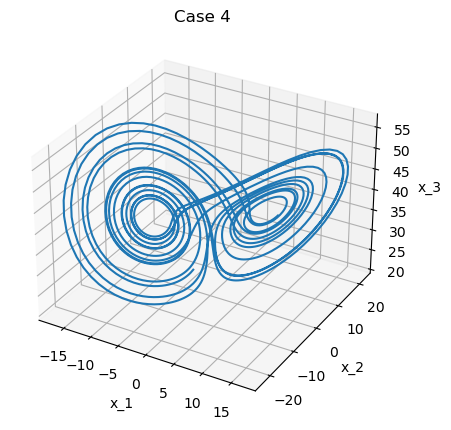

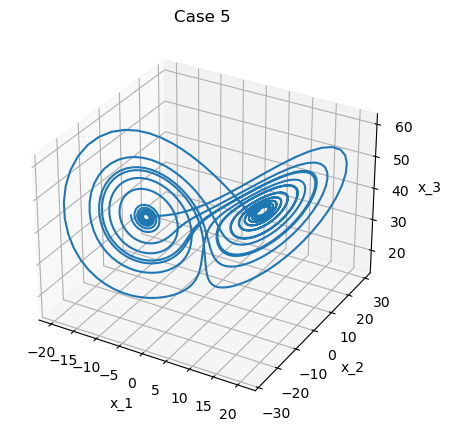

...

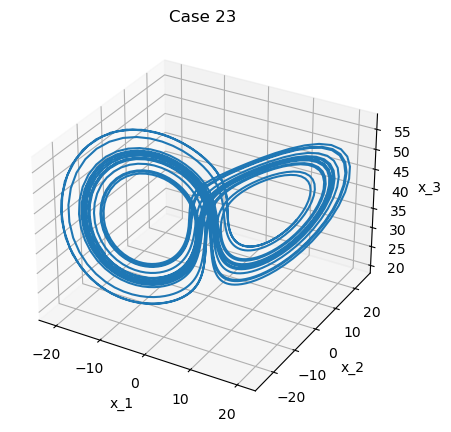

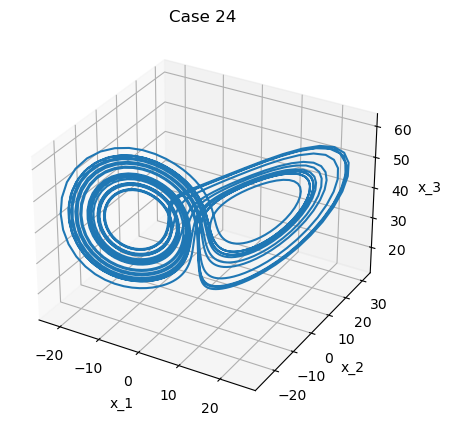

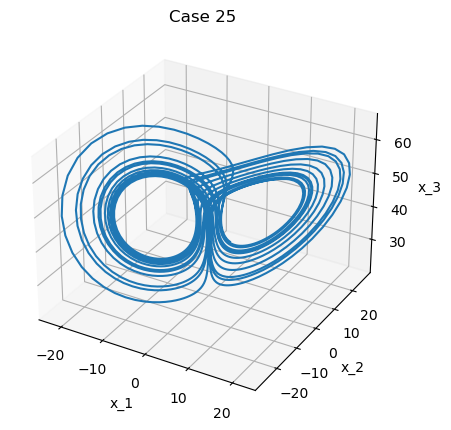

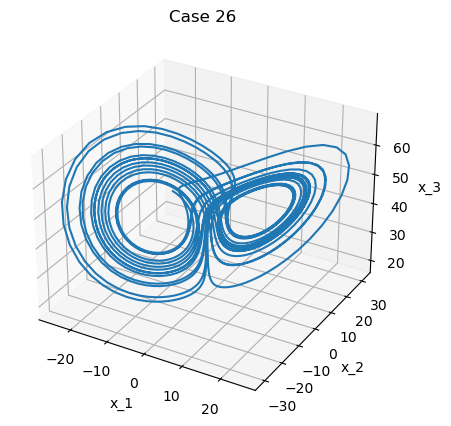

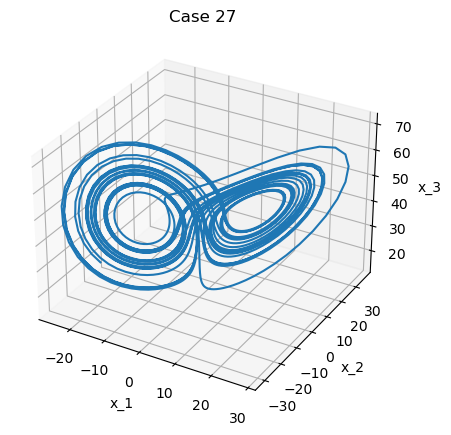

In [15]:
plot_time = 20

plot(
    boundary_idx_arr,
    delta_t,
    all_data,
    plot_time=plot_time,)

In [16]:
positve_lp_idx = np.where(lyapunov_time_arr > 0)[0]
print(positve_lp_idx)

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26]


In [17]:
last_idx = all_data.shape[0]
temp_bia = np.zeros(shape=1+boundary_idx_arr.shape[0], dtype=np.int32)
temp_bia[1:] = boundary_idx_arr
print(temp_bia)
for i in range(boundary_idx_arr.shape[0]-1, -1, -1):
    if not (i in positve_lp_idx):
        print(i)
        num_idxs = last_idx - temp_bia[i+1]
        all_data[temp_bia[i]:temp_bia[i]+num_idxs] = all_data[temp_bia[i+1]:last_idx]
        last_idx = last_idx - (temp_bia[i+1]-temp_bia[i])

[     0  10001  20002  30003  40004  50005  60006  70007  80008  90009
 100010 110011 120012 130013 140014 150015 160016 170017 180018 190019
 200020 210021 220022 230023 240024 250025 260026 270027]


In [18]:
new_bia = np.empty_like(boundary_idx_arr)
new_bia[:] = boundary_idx_arr
new_pmat = np.empty_like(params_mat)
new_pmat[:, :] = params_mat
counter = 0
bia_counter = boundary_idx_arr.shape[0]
for i in range(boundary_idx_arr.shape[0]):
    if not (i in positve_lp_idx):
        new_bia[i:] -= temp_bia[i+1] - temp_bia[i]
        new_bia[i:bia_counter-1] = new_bia[i+1:bia_counter]
        new_pmat[i:bia_counter-1] = new_pmat[i+1:bia_counter]
        bia_counter -= 1

In [19]:
new_bia = new_bia[0:bia_counter]
new_pmat = new_pmat[0:bia_counter]

In [20]:
all_data = all_data[0:new_bia[-1]]

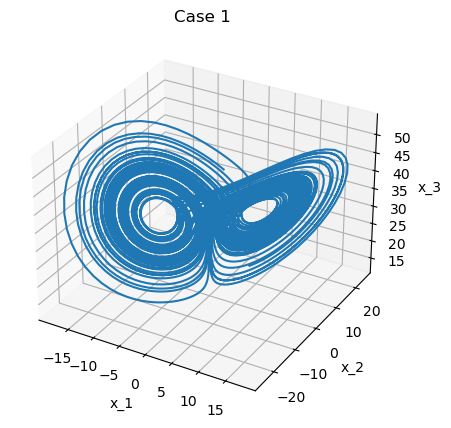

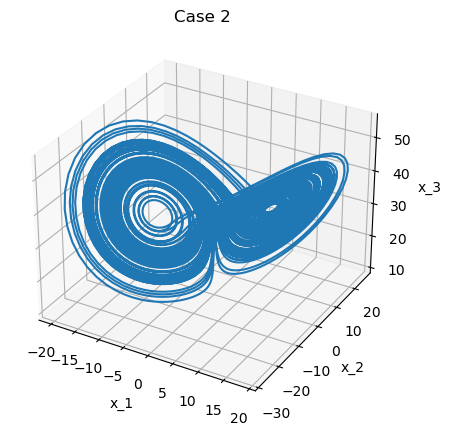

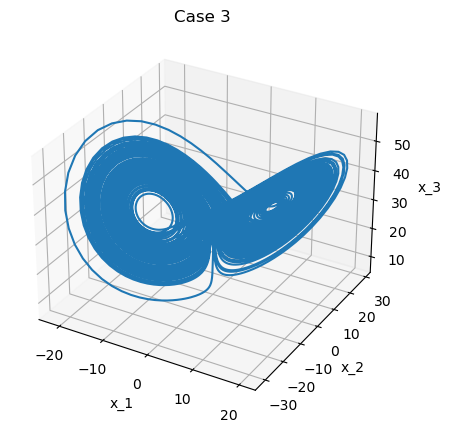

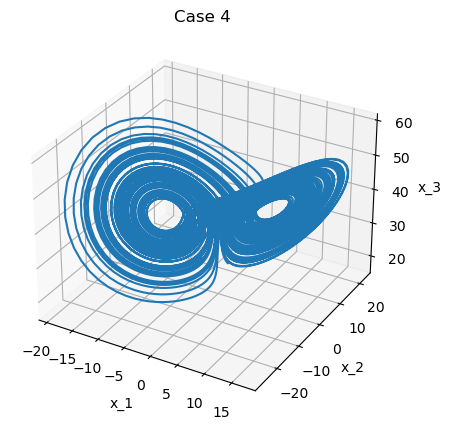

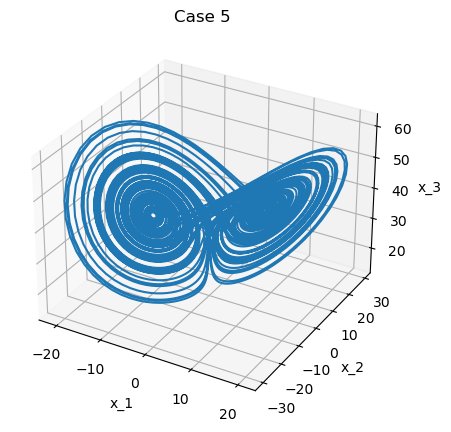

...

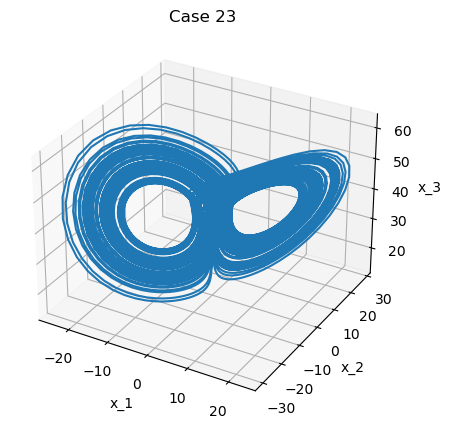

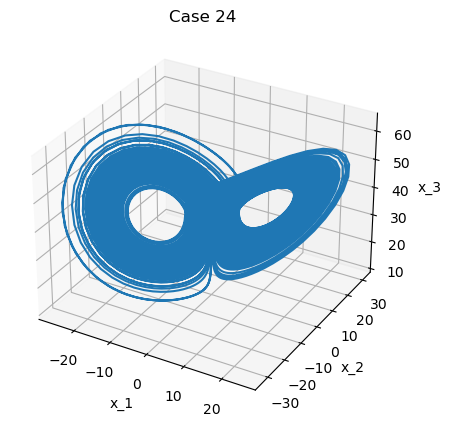

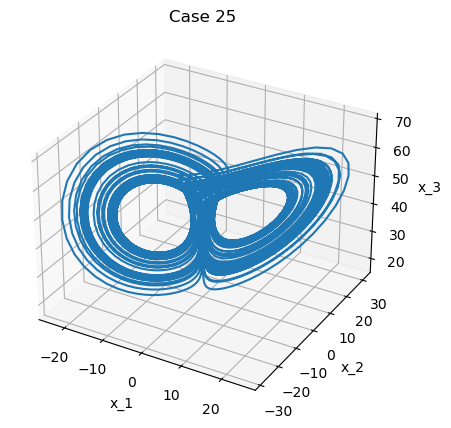

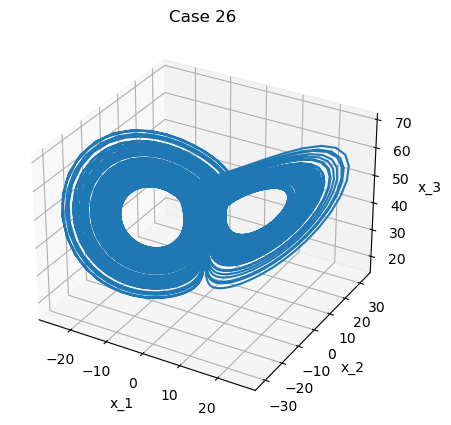

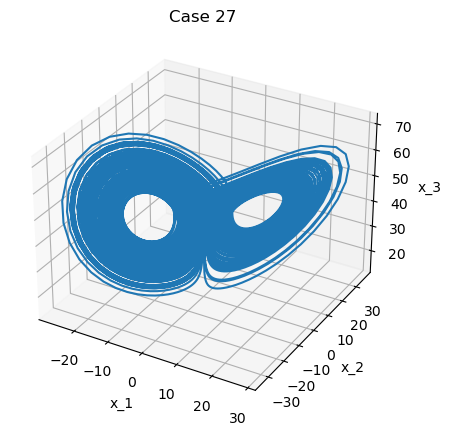

In [21]:
plot_time = 100

plot(
    new_bia,
    delta_t,
    all_data,
    plot_time=plot_time,)

In [22]:
new_bia, boundary_idx_arr = boundary_idx_arr, new_bia
new_pmat, params_mat = params_mat, new_pmat

In [23]:
# dealing with normalizing the data before feeding into autoencoder
if behaviour == 'initialiseAndTrainFromScratch':
    # normalize data before feeding into autoencoder?
    normalizeforae_flag = True
    normalization_type = 'stddev' # could be 'stddev' or 'minmax'
    stddev_multiplier = 3
    stddev_multiplier_pm = 1
    num_params = params_mat.shape[1]
    
    ae_data_with_params = False # whether to feed in the parameters to the AE along with the data?
    
    og_vars = all_data.shape[1]
    if alldata_withparams_flag == True:
        og_vars -= num_params

    if ae_data_with_params == False:
        stddev_multiplier_pm = None
    if normalizeforae_flag == False:
        stddev_multiplier = None

    if ae_data_with_params == True and alldata_withparams_flag == False:
        new_all_data = np.empty(shape=(all_data.shape[0], og_vars+num_params), dtype=FTYPE)
        new_all_data[:, 0:og_vars] = all_data[:, 0:og_vars]
        del(all_data)
        all_data = new_all_data
        prev_idx = 0
        for i in range(boundary_idx_arr.shape[0]):
            all_data[prev_idx:boundary_idx_arr[i], num_params:] = params_mat[i]
            prev_idx = boundary_idx_arr[i]

    normalization_constant_arr_aedata = None
    if normalizeforae_flag == True:
        normalization_constant_arr_aedata = np.empty(shape=(2, all_data.shape[1]), dtype=FTYPE)
        if normalization_type == 'stddev':
            sample_mean = np.mean(all_data, axis=0)
            sample_std = np.std(all_data, axis=0)
            normalization_constant_arr_aedata[0, :] = sample_mean
            normalization_constant_arr_aedata[1, 0:og_vars] = stddev_multiplier*sample_std[0:og_vars]
            if ae_data_with_params == True:
                normalization_constant_arr_aedata[1, og_vars:] = stddev_multiplier_pm*sample_std[og_vars:]
            zero_idx = np.where(normalization_constant_arr_aedata[1] == 0.0)[0]
            if len(zero_idx) > 0:
                normalization_constant_arr_aedata[1, zero_idx] = 1.0
        elif normalization_type == 'minmax':
            for i in range(all_data.shape[1]):
                sample_min = np.min(all_data[:, i])
                sample_max = np.max(all_data[:, i])
                if sample_max - sample_min == 0:
                    sample_min = sample_min - 0.5
                    sample_max = sample_min + 1
                normalization_constant_arr_aedata[0, i] = sample_min
                normalization_constant_arr_aedata[1, i] = sample_max - sample_min
        # if ae_data_with_params == True:
        #     normalization_constant_arr_aedata[0, og_vars:] = 0.0
        #     normalization_constant_arr_aedata[1, og_vars:] = 1.0
        for i in range(all_data.shape[1]):
            all_data[:, i] -= normalization_constant_arr_aedata[0, i]
            all_data[:, i] /= normalization_constant_arr_aedata[1, i]
            
    # saving sim data
    ae_data = {
        'data_dir_idx':data_dir_idx,
        'normalizeforae_flag':normalizeforae_flag,
        'normalization_constant_arr_aedata':normalization_constant_arr_aedata,
        'normalization_type':normalization_type,
        'stddev_multiplier':stddev_multiplier,
        'stddev_multiplier_pm':stddev_multiplier_pm,
        'ae_data_with_params':ae_data_with_params,
        'module':Autoencoder.__module__,
    }
    with open(dir_name_ae+dir_sep+'ae_data.txt', 'w') as f:
        f.write(str(ae_data))
    np.savez(
        dir_name_ae+dir_sep+'normalization_data',
        normalization_constant_arr_aedata=[normalization_constant_arr_aedata],
    )
else:
    if normalizeforae_flag == True:
        for i in range(all_data.shape[1]):
            all_data[:, i] -= normalization_constant_arr_aedata[0, i]
            all_data[:, i] /= normalization_constant_arr_aedata[1, i]
            
time_stddev = np.std(all_data, axis=0)
if ae_data_with_params == False:
    all_data = all_data[:, 0:og_vars]
    time_stddev = time_stddev[0:og_vars]
else:
    time_stddev[og_vars:] = 1.0

In [24]:
normalization_constant_arr_aedata

array([[ 0.06194318,  0.06183899, 36.243877  ],
       [25.502903  , 28.335331  , 31.247097  ]], dtype=float32)

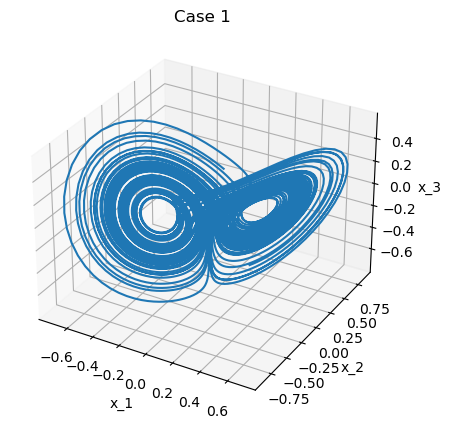

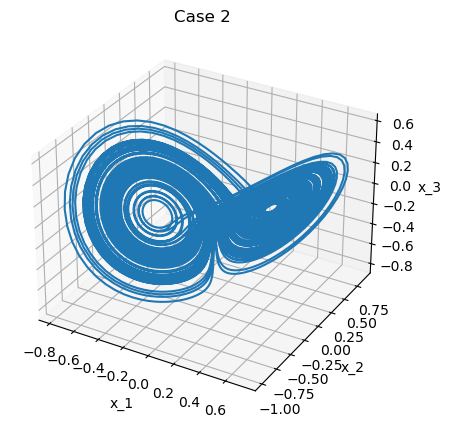

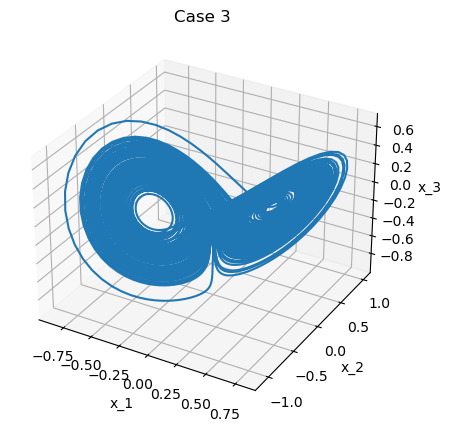

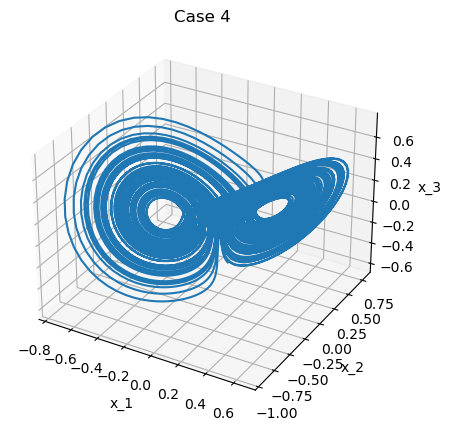

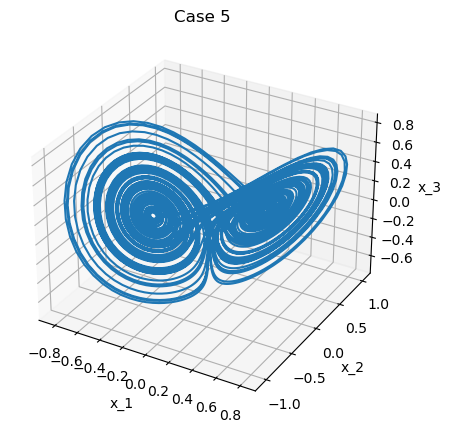

...

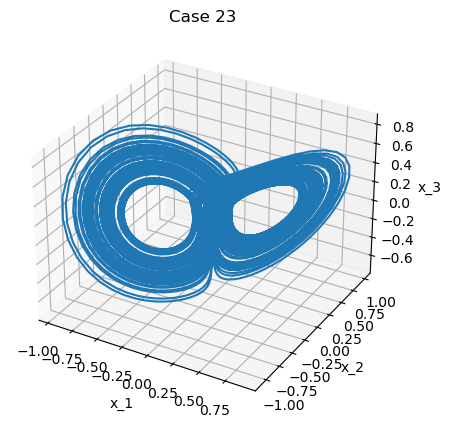

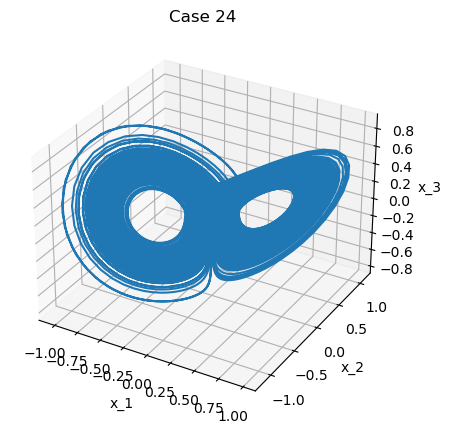

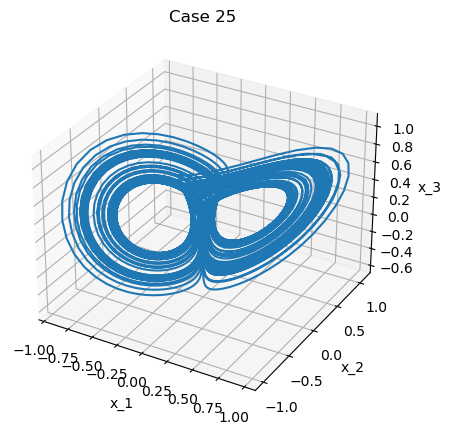

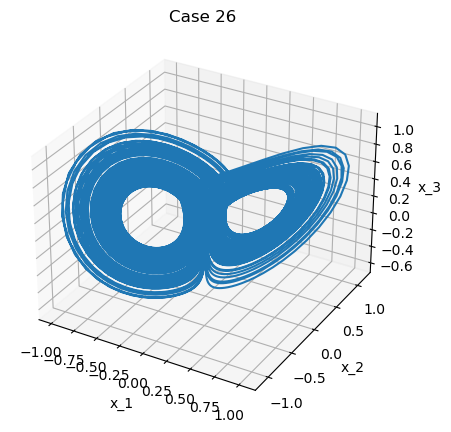

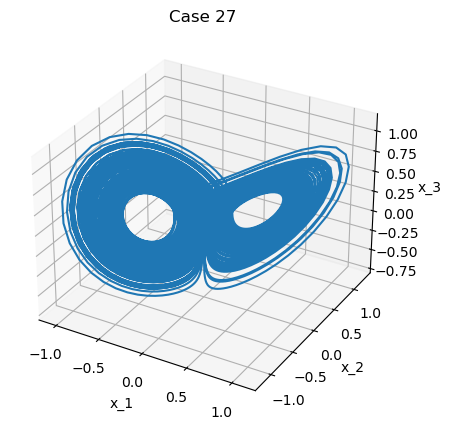

In [25]:
plot_time = 100

plot(
    boundary_idx_arr,
    delta_t,
    all_data,
    plot_time=plot_time,)

# Autoencoder

In [26]:
# setting up training params
if behaviour == 'initialiseAndTrainFromScratch':
    learning_rate_list = [1e-3, 1e-4, 1e-5]
    epochs = 2000
    patience = 200  # parameter for early stopping
    min_delta = 1e-6  # parameter for early stopping
    lambda_reg = 1e-5 # weight for regularizer
    train_split = 0.8
    val_split = 0.1
    test_split = 1 - train_split - val_split
    batch_size = 2**6
    fRMS = 0.5/100
    timeMeanofSpaceRMS = np.mean(np.mean(all_data[:, 0:3]**2, axis=1)**0.5)
    
    # stddev = fRMS*timeMeanofSpaceRMS
    stddev = fRMS * np.mean(time_stddev[0:3])
    contractive_lmda = 0.0
    use_weights_post_dense = True
    dropout_rate = 0.0
    
    print('stddev : ', stddev)

    # saving training params
    training_specific_params = {
        'learning_rate_list':learning_rate_list,
        'epochs':epochs,
        'patience':patience,
        'min_delta':min_delta,
        'prng_seed':prng_seed,
        'train_split':train_split,
        'val_split':val_split,
        'batch_size':batch_size,
        'fRMS':fRMS,
        'timeMeanofSpaceRMS':timeMeanofSpaceRMS,
        'stddev':stddev,
        'contractive_lmda':contractive_lmda,
        'dropout_rate':dropout_rate,
    }

    with open(dir_name_ae+dir_sep+'training_specific_params.txt', 'w') as f:
        f.write(str(training_specific_params))
else:
    with open(dir_name_ae + dir_sep + 'training_specific_params.txt') as f:
        lines = f.readlines()

    tparams_dict = eval(''.join(lines))

    learning_rate_list = tparams_dict['learning_rate_list']
    epochs = tparams_dict['epochs']
    patience = tparams_dict['patience']
    min_delta = tparams_dict['min_delta']
    prng_seed = tparams_dict['prng_seed']
    train_split = tparams_dict['train_split']
    val_split = tparams_dict['val_split']
    batch_size = tparams_dict['batch_size']
    try:
        stddev = tparams_dict['stddev']
    except:
        print("'stddev' not in tparams_dict, set to 0")
        stddev = 0.0
    try:
        contractive_lmda = tparams_dict['contractive_lmda']
    except:
        print("'contractive_lmda' not in tparams_dict, set to 0")
        contractive_lmda = 0.0
    try:
        dropout_rate = tparams_dict['dropout_rate']
    except:
        print("'dropout_rate' not in tparams_dict, set to 0")
        dropout_rate = 0.0

    test_split = 1 - train_split - val_split

    # setting seed for PRNGs
    np.random.seed(prng_seed)
    tf.random.set_seed(prng_seed)

stddev :  0.001666674017906189


In [27]:
# # setting up data
# idx = np.arange(all_data.shape[0])
# np.random.shuffle(idx)
# boundary = int(np.round((1-test_split)*all_data.shape[0]))
# training_data = all_data[idx[0:boundary], :]
# testing_data = all_data[idx[boundary:], :]

In [28]:
cum_samples = boundary_idx_arr[-1]
# idx = np.arange(cum_samples)
# np.random.shuffle(idx)
num_train = 0
num_val = 0
begin_idx = 0
for i in range(len(boundary_idx_arr)):
    num_samples = boundary_idx_arr[i] - begin_idx
    num_train += int( np.round(train_split*num_samples) )
    num_val += int( np.round(val_split*num_samples) )
    begin_idx = boundary_idx_arr[i]

# defining shapes
training_shape = [num_train]
training_shape.extend(all_data.shape[1:])

val_shape = [num_val]
val_shape.extend(all_data.shape[1:])

testing_shape = [cum_samples-num_train-num_val]
testing_shape.extend(all_data.shape[1:])

# defining required arrays
training_data = np.empty(shape=training_shape)

val_data = np.empty(shape=val_shape)

testing_data = np.empty(shape=testing_shape)

begin_idx = 0
training_data_rolling_count = 0
val_data_rolling_count = 0
testing_data_rolling_count = 0
for i in range(len(boundary_idx_arr)):
    num_samples = boundary_idx_arr[i] - begin_idx
    num_train = int( np.round(train_split*num_samples) )
    num_val = int( np.round(val_split*num_samples) )

    training_data[training_data_rolling_count:training_data_rolling_count+num_train] = all_data[begin_idx:begin_idx+num_train]
    training_data_rolling_count += num_train

    val_data[val_data_rolling_count:val_data_rolling_count+num_val] = all_data[begin_idx+num_train:begin_idx+num_train+num_val]
    val_data_rolling_count += num_val

    num_test = num_samples-num_train-num_val
    testing_data[testing_data_rolling_count:testing_data_rolling_count+num_test] = all_data[begin_idx+num_train+num_val:begin_idx+num_train+num_val+num_test]
    testing_data_rolling_count += num_test

    begin_idx = boundary_idx_arr[i]

# further shuffling
# idx = np.arange(0, training_data.shape[0])
# np.random.shuffle(idx)
# training_data_rnn_input = training_data_rnn_input[idx]
np.random.shuffle(training_data)

# idx = np.arange(0, val_data.shape[0])
# np.random.shuffle(idx)
# val_data = val_data[idx]
np.random.shuffle(val_data)

# idx = np.arange(0, testing_data.shape[0])
# np.random.shuffle(idx)
# testing_data = testing_data[idx]
np.random.shuffle(testing_data)

In [29]:
#

In [30]:
# Initialize network
if behaviour == 'initialiseAndTrainFromScratch':
    latent_space_dim = 2
    # enc_layers = [128, 96, 64, 48, 32, 24, 26, 8, 4]
    # enc_layers = [192, 96, 48, 24, 12, 6, 3]
    # enc_layers = [96, 48, 24, 12, 6, 3]
    # enc_layers = [128, 64, 32, 16, 8, 4]
    # enc_layers = []
    # enc_layers = [32, 16, 8, 4]
    # for i in range(len(enc_layers)):
    #     if latent_space_dim < enc_layers[-i-1]:
    #         enc_layers = enc_layers[0:-i]
    #         break
    #     if i == len(enc_layers)-1:
    #         enc_layers = []
    # dec_layers = enc_layers[::-1]
    enc_layers = [8, 6, 4, 2]
    dec_layers = [2, 4, 6, 8]
    
    enc_layer_act_func = 'elu' #'modified_relu_2'
    enc_final_layer_act_func = 'tanh'
    dec_layer_act_func = 'elu' #'modified_relu_2'
    dec_final_layer_act_func = 'tanh'
    reg_name = 'L2'
    
    if strategy is not None:
        with strategy.scope():
            ae_net = Autoencoder(
                data_dim=all_data.shape[1],
                enc_layers=enc_layers,
                dec_layers=dec_layers,
                latent_space_dim=latent_space_dim,
                lambda_reg=lambda_reg,
                reg_name=reg_name,
                enc_layer_act_func=enc_layer_act_func,
                enc_final_layer_act_func=enc_final_layer_act_func,
                dec_layer_act_func=dec_layer_act_func,
                dec_final_layer_act_func=dec_final_layer_act_func,
                load_file=None,
                stddev=stddev,
                contractive_lmda=contractive_lmda,
                dropout_rate=dropout_rate,
                use_weights_post_dense=use_weights_post_dense,)
    else:
        ae_net = Autoencoder(
            data_dim=all_data.shape[1],
            enc_layers=enc_layers,
            dec_layers=dec_layers,
            latent_space_dim=latent_space_dim,
            lambda_reg=lambda_reg,
            reg_name=reg_name,
            enc_layer_act_func=enc_layer_act_func,
            enc_final_layer_act_func=enc_final_layer_act_func,
            dec_layer_act_func=dec_layer_act_func,
            dec_final_layer_act_func=dec_final_layer_act_func,
            load_file=None,
            stddev=stddev,
            contractive_lmda=contractive_lmda,
            dropout_rate=dropout_rate,
            use_weights_post_dense=use_weights_post_dense,)
    # saving the AE configuration
    save_path = dir_name_ae+dir_sep+'final_net'
    if not os.path.isdir(save_path):
        os.makedirs(save_path)
    ae_net.save_class_dict(save_path+dir_sep+'final_net_class_dict.txt')
else:
    load_file = dir_name_ae + dir_sep + 'final_net' + dir_sep + 'final_net_class_dict.txt'
    if strategy is not None:
        with strategy.scope():
            ae_net = Autoencoder(data_dim=all_data.shape[1], load_file=load_file)
    else:
        ae_net = Autoencoder(data_dim=all_data.shape[1], load_file=load_file)
    
    if behaviour == 'loadCheckpointAndContinueTraining':
        wt_file = tf.train.latest_checkpoint(dir_name_ae+dir_sep+'checkpoints')
        # ae_net.load_weights(wt_file)
    elif behaviour == 'loadFinalNetAndPlot':
        wt_file = dir_name_ae+dir_sep+'final_net'+dir_sep+'final_net_ae_weights.h5'
        ae_net.load_weights_from_file(wt_file)

In [31]:
#

In [32]:
if behaviour == 'initialiseAndTrainFromScratch':
    val_loss_hist = []
    train_loss_hist = []
    lr_change=[0, 0]
    savelosses_cb_vallossarr = np.ones(shape=epochs*len(learning_rate_list))*np.NaN
    savelosses_cb_trainlossarr = np.ones(shape=epochs*len(learning_rate_list))*np.NaN
    starting_lr_idx = 0
    num_epochs_left = epochs
elif behaviour == 'loadCheckpointAndContinueTraining':
    val_loss_hist, train_loss_hist, lr_change, starting_lr_idx, num_epochs_left, val_loss_arr_fromckpt, train_loss_arr_fromckpt = readAndReturnLossHistories(
        dir_name_ae=dir_name_ae,
        dir_sep=dir_sep,
        epochs=epochs,
        learning_rate_list=learning_rate_list)
    savelosses_cb_vallossarr = val_loss_arr_fromckpt
    savelosses_cb_trainlossarr = train_loss_arr_fromckpt
elif behaviour == 'loadFinalNetAndPlot':
    with open(dir_name_ae+'{ds}final_net{ds}losses.txt'.format(ds=dir_sep), 'r') as f:
        lines = f.readlines()
    
    losses_dict = eval(''.join(lines))

    val_loss_hist = losses_dict['val_loss_hist']
    train_loss_hist = losses_dict['train_loss_hist']
    lr_change = losses_dict['lr_change']
    test_loss = losses_dict['test_loss']

In [33]:
train_MSE_hist = []
val_MSE_hist = []

train_NMSE_hist = []
val_NMSE_hist = []

train_ls_jacobian_norm_hist = []

train_real_MSE_hist = []
val_real_MSE_hist = []

train_params_MSE_hist = []
val_params_MSE_hist = []

In [34]:
class NMSE(tf.keras.metrics.MeanSquaredError):
    def __init__(self, divisor_arr, name='NMSE', **kwargs):
        super(NMSE, self).__init__(name, **kwargs)
        self.divisor_arr = divisor_arr

    def update_state(self, y_true, y_pred, sample_weight=None):
        y_true = y_true / self.divisor_arr
        y_pred = y_pred / self.divisor_arr
        return super(NMSE, self).update_state(y_true, y_pred, sample_weight)

class real_MSE(tf.keras.metrics.MeanSquaredError):
    def __init__(self, og_vars, name='real_MSE', **kwargs):
        super().__init__(name, **kwargs)
        self.og_vars = og_vars

    def update_state(self, y_true, y_pred, sample_weight=None):
        y_true = y_true[:, 0:self.og_vars]
        y_pred = y_pred[:, 0:self.og_vars]
        return super().update_state(y_true, y_pred, sample_weight)
    
class params_MSE(tf.keras.metrics.MeanSquaredError):
    def __init__(self, og_vars, name='params_MSE', **kwargs):
        super().__init__(name, **kwargs)
        self.og_vars = og_vars

    def update_state(self, y_true, y_pred, sample_weight=None):
        y_true = y_true[:, self.og_vars:]
        y_pred = y_pred[:, self.og_vars:]
        return super().update_state(y_true, y_pred, sample_weight)

In [35]:
# compiling the network
ae_net.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate_list[0]),
    loss=losses.MeanSquaredError(),
#     loss=losses.BinaryCrossentropy(from_logits=False),
    run_eagerly=False,
    metrics=['mse', NMSE(divisor_arr=tf.constant(time_stddev)), real_MSE(og_vars), params_MSE(og_vars)]
)

if behaviour == 'loadCheckpointAndContinueTraining':
    # this loads the weights/attributes of the optimizer as well
    if strategy is not None:
        with strategy.scope():
            ae_net.load_weights(wt_file)
    else:
        ae_net.load_weights(wt_file)

if behaviour == 'initialiseAndTrainFromScratch' or behaviour == 'loadCheckpointAndContinueTraining':
    metric_to_use = 'val_mse'
    # implementing early stopping
    early_stopping_cb = tf.keras.callbacks.EarlyStopping(
        monitor=metric_to_use,
        patience=patience,
        restore_best_weights=True,
        verbose=True,
        min_delta=min_delta
    )

    # time callback for each epoch
    timekeeper_cb = mytimecallback()

    # model checkpoint callback
    dir_name_ckpt = dir_name_ae+dir_sep+'checkpoints'
    if not os.path.isdir(dir_name_ckpt):
        os.makedirs(dir_name_ckpt)
    checkpoint_cb = tf.keras.callbacks.ModelCheckpoint(
        filepath=dir_name_ckpt+dir_sep+'checkpoint',#+'/checkpoint--loss={loss:.4f}--vall_loss={val_loss:.4f}',
        monitor=metric_to_use,
        save_best_only=True,
        save_weights_only=True,
        verbose=2,
        period=1  # saves every 5 epochs
    )

    # save losses callback
    savelosses_cb = SaveLosses(
        filepath=dir_name_ckpt+dir_sep+'LossHistoriesCheckpoint',
        val_loss_arr=savelosses_cb_vallossarr,
        train_loss_arr=savelosses_cb_trainlossarr,
        total_epochs=epochs,
        period=1)

    # training the network
    for i in range(starting_lr_idx, len(learning_rate_list)):
        learning_rate = learning_rate_list[i]
        K.set_value(ae_net.optimizer.lr, learning_rate)

        savelosses_cb.update_lr_idx(i)

        if i == starting_lr_idx:
            EPOCHS = num_epochs_left
            savelosses_cb.update_offset(epochs-num_epochs_left)
        else:
            EPOCHS = epochs
            savelosses_cb.update_offset(0)

        total_s_len = 80
        sep_lr_s = ' LEARNING RATE : {} '.format(learning_rate)
        sep_lr_s = int((total_s_len - len(sep_lr_s))//2)*'-' + sep_lr_s
        sep_lr_s = sep_lr_s + (total_s_len-len(sep_lr_s))*'-'
        print('\n\n' + '-'*len(sep_lr_s))
        print('\n' + sep_lr_s+'\n')
        print('-'*len(sep_lr_s) + '\n\n')
        
        history = ae_net.fit(training_data, training_data,
            epochs=EPOCHS,
            batch_size=batch_size,
#             validation_split=val_split/train_split,
            validation_data=(val_data, val_data),
            callbacks=[early_stopping_cb, timekeeper_cb, checkpoint_cb, savelosses_cb],
            verbose=1,
            shuffle=True,
        )

        val_loss_hist.extend(history.history['val_loss'])
        train_loss_hist.extend(history.history['loss'])
        
        val_MSE_hist.extend(history.history['val_mse'])
        train_MSE_hist.extend(history.history['mse'])
        
        val_NMSE_hist.extend(history.history['val_NMSE'])
        train_NMSE_hist.extend(history.history['NMSE'])
        
        train_ls_jacobian_norm_hist.append(history.history['ls_jacobian_norm'])
        
        val_real_MSE_hist.extend(history.history['val_real_MSE'])
        train_real_MSE_hist.extend(history.history['real_MSE'])
        
        val_params_MSE_hist.extend(history.history['val_params_MSE'])
        train_params_MSE_hist.extend(history.history['params_MSE'])
        
        if i == starting_lr_idx:
            lr_change[i+1] += len(history.history['val_loss'])
        else:
            lr_change.append(lr_change[i]+len(history.history['val_loss']))



--------------------------------------------------------------------------------

---------------------------- LEARNING RATE : 0.001 -----------------------------

--------------------------------------------------------------------------------


Epoch 1/2000
3366/3376 [============================>.] - ETA: 0s - loss: 0.0066 - mse: 0.0061 - NMSE: 0.0547 - real_MSE: 0.0061 - params_MSE: nan - ls_jacobian_norm: 0.4064 - tot_time: 0h 0m 21.2s

Epoch 1: val_mse improved from inf to 0.00249, saving model to /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/checkpoint
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 21s 6ms/step - loss: 0.0066 - mse: 0.0061 - NMSE: 0.0547 - real_MSE: 0.0061 - params_MSE: nan - ls_jacobian_norm: 0.4062 - val_loss: 0.0031 - val_mse: 0.0025 - val_NMSE: 0.0224 - val_real_MSE: 0.0025 - val_params_MSE: nan - val

 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0018 - mse: 0.0013 - NMSE: 0.0113 - real_MSE: 0.0013 - params_MSE: nan - ls_jacobian_norm: 0.4042 - val_loss: 0.0018 - val_mse: 0.0012 - val_NMSE: 0.0108 - val_real_MSE: 0.0012 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 12/2000
3374/3376 [============================>.] - ETA: 0s - loss: 0.0018 - mse: 0.0012 - NMSE: 0.0112 - real_MSE: 0.0012 - params_MSE: nan - ls_jacobian_norm: 0.4124 - tot_time: 0h 3m 51.4s

Epoch 12: val_mse improved from 0.00120 to 0.00117, saving model to /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/checkpoint
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0018 - mse: 0.0012 

Epoch 23/2000
3371/3376 [============================>.] - ETA: 0s - loss: 0.0017 - mse: 0.0011 - NMSE: 0.0103 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4264 - tot_time: 0h 7m 19.4s

Epoch 23: val_mse did not improve from 0.00109
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0017 - mse: 0.0011 - NMSE: 0.0103 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4264 - val_loss: 0.0016 - val_mse: 0.0011 - val_NMSE: 0.0098 - val_real_MSE: 0.0011 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 24/2000
3370/3376 [============================>.] - ETA: 0s - loss: 0.0017 - mse: 0.0011 - NMSE: 0.0102 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4260 - tot_time: 0h 7m 38.3s

Epoch 24: val_mse improved from 0.00109 to 0.00106, saving model to /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae

Epoch 35/2000
3369/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0100 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4234 - tot_time: 0h 11m 5.8s

Epoch 35: val_mse did not improve from 0.00105
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0100 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4234 - val_loss: 0.0016 - val_mse: 0.0011 - val_NMSE: 0.0097 - val_real_MSE: 0.0011 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 36/2000
3368/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0100 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4234 - tot_time: 0h 11m 24.7s

Epoch 36: val_mse did not improve from 0.00105
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/

Epoch 47/2000
3368/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0099 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4197 - tot_time: 0h 14m 48.4s

Epoch 47: val_mse did not improve from 0.00105
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0099 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4197 - val_loss: 0.0016 - val_mse: 0.0011 - val_NMSE: 0.0096 - val_real_MSE: 0.0011 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 48/2000
3372/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0099 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4200 - tot_time: 0h 15m 7.1s

Epoch 48: val_mse did not improve from 0.00105
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/

Epoch 59/2000
3366/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0098 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4192 - tot_time: 0h 18m 31.2s

Epoch 59: val_mse did not improve from 0.00102
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 5ms/step - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0098 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4192 - val_loss: 0.0016 - val_mse: 0.0010 - val_NMSE: 0.0094 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 60/2000
3368/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0098 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4200 - tot_time: 0h 18m 49.8s

Epoch 60: val_mse did not improve from 0.00102
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz

3375/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0098 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4179 - tot_time: 0h 22m 14.1s

Epoch 71: val_mse did not improve from 0.00102
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 5ms/step - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0098 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4179 - val_loss: 0.0016 - val_mse: 0.0011 - val_NMSE: 0.0095 - val_real_MSE: 0.0011 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 72/2000
3367/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0098 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4181 - tot_time: 0h 22m 32.8s

Epoch 72: val_mse did not improve from 0.00102
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_0

3369/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0098 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4169 - tot_time: 0h 25m 57.7s

Epoch 83: val_mse did not improve from 0.00102
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 5ms/step - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0098 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4169 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0093 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 84/2000
3376/3376 [==============================] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0098 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4162 - tot_time: 0h 26m 16.2s

Epoch 84: val_mse did not improve from 0.00102
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_0

3371/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0098 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4141 - tot_time: 0h 29m 40.8s

Epoch 95: val_mse did not improve from 0.00102
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 18s 5ms/step - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0098 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4141 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0094 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 96/2000
3372/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0098 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4141 - tot_time: 0h 29m 59.3s

Epoch 96: val_mse did not improve from 0.00102
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_0

3376/3376 [==============================] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4138 - tot_time: 0h 33m 24.5s

Epoch 107: val_mse did not improve from 0.00102
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4138 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0093 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 108/2000
3374/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4128 - tot_time: 0h 33m 43.3s

Epoch 108: val_mse did not improve from 0.00102
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/a

3372/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4150 - tot_time: 0h 37m 8.7s

Epoch 119: val_mse did not improve from 0.00102
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4150 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0093 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 120/2000
3373/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4153 - tot_time: 0h 37m 27.7s

Epoch 120: val_mse did not improve from 0.00102
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae

3368/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4170 - tot_time: 0h 40m 53.1s

Epoch 131: val_mse did not improve from 0.00102
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4170 - val_loss: 0.0016 - val_mse: 0.0011 - val_NMSE: 0.0095 - val_real_MSE: 0.0011 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 132/2000
3373/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4178 - tot_time: 0h 41m 11.7s

Epoch 132: val_mse did not improve from 0.00102
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/a

Epoch 143/2000
3366/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4190 - tot_time: 0h 44m 37.1s

Epoch 143: val_mse did not improve from 0.00102
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 5ms/step - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4190 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0092 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 144/2000
3375/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4190 - tot_time: 0h 44m 55.7s

Epoch 144: val_mse did not improve from 0.00102
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lo

Epoch 155/2000
3373/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4208 - tot_time: 0h 48m 21.6s

Epoch 155: val_mse did not improve from 0.00102
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4208 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0093 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 156/2000
3375/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4212 - tot_time: 0h 48m 40.2s

Epoch 156: val_mse did not improve from 0.00102
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lo

3369/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4226 - tot_time: 0h 52m 5.8s

Epoch 167: val_mse did not improve from 0.00102
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4227 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0092 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 168/2000
3370/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4225 - tot_time: 0h 52m 24.4s

Epoch 168: val_mse did not improve from 0.00102
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae

Epoch 179/2000
3374/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4230 - tot_time: 0h 55m 49.3s

Epoch 179: val_mse did not improve from 0.00102
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4230 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0093 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 180/2000
3370/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4234 - tot_time: 0h 56m 7.9s

Epoch 180: val_mse did not improve from 0.00102
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lor

Epoch 191/2000
3370/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4243 - tot_time: 0h 59m 32.2s

Epoch 191: val_mse did not improve from 0.00101
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 5ms/step - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4243 - val_loss: 0.0016 - val_mse: 0.0011 - val_NMSE: 0.0098 - val_real_MSE: 0.0011 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 192/2000
3376/3376 [==============================] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4244 - tot_time: 0h 59m 50.8s

Epoch 192: val_mse did not improve from 0.00101
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lo

3374/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4251 - tot_time: 1h 3m 15.5s

Epoch 203: val_mse did not improve from 0.00101
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4251 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0094 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 204/2000
3371/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4256 - tot_time: 1h 3m 34.1s

Epoch 204: val_mse did not improve from 0.00101
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_

3372/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4261 - tot_time: 1h 6m 59.4s

Epoch 215: val_mse did not improve from 0.00101
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4261 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0093 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 216/2000
3376/3376 [==============================] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4265 - tot_time: 1h 7m 18.1s

Epoch 216: val_mse did not improve from 0.00101
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_

3371/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4268 - tot_time: 1h 10m 43.4s

Epoch 227: val_mse did not improve from 0.00101
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4268 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0091 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 228/2000
3368/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4272 - tot_time: 1h 11m 2.0s

Epoch 228: val_mse did not improve from 0.00101
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae

3372/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4271 - tot_time: 1h 14m 26.9s

Epoch 239: val_mse did not improve from 0.00101
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4271 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0094 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 240/2000
3369/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4274 - tot_time: 1h 14m 45.9s

Epoch 240: val_mse did not improve from 0.00101
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/a

3371/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4276 - tot_time: 1h 18m 10.7s

Epoch 251: val_mse did not improve from 0.00101
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4276 - val_loss: 0.0016 - val_mse: 0.0011 - val_NMSE: 0.0095 - val_real_MSE: 0.0011 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 252/2000
3372/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4276 - tot_time: 1h 18m 29.3s

Epoch 252: val_mse did not improve from 0.00101
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/a

3370/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4277 - tot_time: 1h 21m 54.8s

Epoch 263: val_mse did not improve from 0.00101
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4277 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0093 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 264/2000
3372/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4275 - tot_time: 1h 22m 13.4s

Epoch 264: val_mse did not improve from 0.00101
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/a

3374/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4268 - tot_time: 1h 25m 37.8s

Epoch 275: val_mse did not improve from 0.00101
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 18s 5ms/step - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4268 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0092 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 276/2000
3367/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4276 - tot_time: 1h 25m 56.4s

Epoch 276: val_mse did not improve from 0.00101
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/a

3373/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4279 - tot_time: 1h 29m 20.7s

Epoch 287: val_mse did not improve from 0.00101
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 5ms/step - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4279 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0094 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 288/2000
3370/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4283 - tot_time: 1h 29m 39.2s

Epoch 288: val_mse did not improve from 0.00101
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/a

3369/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4276 - tot_time: 1h 33m 3.7s

Epoch 299: val_mse did not improve from 0.00101
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4276 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0092 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 300/2000
3370/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4287 - tot_time: 1h 33m 22.3s

Epoch 300: val_mse did not improve from 0.00101
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae

3375/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4281 - tot_time: 1h 36m 46.7s

Epoch 311: val_mse did not improve from 0.00101
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4281 - val_loss: 0.0016 - val_mse: 0.0011 - val_NMSE: 0.0096 - val_real_MSE: 0.0011 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 312/2000
3369/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4284 - tot_time: 1h 37m 5.2s

Epoch 312: val_mse did not improve from 0.00101
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae

3374/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4292 - tot_time: 1h 40m 29.5s

Epoch 323: val_mse did not improve from 0.00101
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 5ms/step - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4291 - val_loss: 0.0015 - val_mse: 0.0011 - val_NMSE: 0.0095 - val_real_MSE: 0.0011 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 324/2000
3374/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4290 - tot_time: 1h 40m 48.0s

Epoch 324: val_mse did not improve from 0.00101
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/a

3374/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4285 - tot_time: 1h 44m 13.2s

Epoch 335: val_mse did not improve from 0.00101
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4285 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0093 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 336/2000
3375/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4284 - tot_time: 1h 44m 31.7s

Epoch 336: val_mse did not improve from 0.00101
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/a

3367/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4288 - tot_time: 1h 47m 56.0s

Epoch 347: val_mse did not improve from 0.00101
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4287 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0092 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 348/2000
3370/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4293 - tot_time: 1h 48m 14.5s

Epoch 348: val_mse did not improve from 0.00101
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/a

3374/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4296 - tot_time: 1h 51m 38.9s

Epoch 359: val_mse did not improve from 0.00101
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 5ms/step - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4296 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0094 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 360/2000
3375/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4296 - tot_time: 1h 51m 57.6s

Epoch 360: val_mse did not improve from 0.00101
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/a

3367/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4289 - tot_time: 1h 55m 22.0s

Epoch 371: val_mse did not improve from 0.00101
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4289 - val_loss: 0.0016 - val_mse: 0.0011 - val_NMSE: 0.0095 - val_real_MSE: 0.0011 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 372/2000
3372/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4297 - tot_time: 1h 55m 40.6s

Epoch 372: val_mse did not improve from 0.00101
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/a

3368/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4295 - tot_time: 1h 59m 4.9s

Epoch 383: val_mse did not improve from 0.00101
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4296 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0092 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 384/2000
3370/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0097 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4294 - tot_time: 1h 59m 23.5s

Epoch 384: val_mse did not improve from 0.00101
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae

 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4185 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0091 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 7/2000
3367/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4179 - tot_time: 2h 2m 48.6s

Epoch 7: val_mse improved from 0.00101 to 0.00101, saving model to /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/checkpoint
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0016 - mse: 0.0011 - 

Epoch 18/2000
3372/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4159 - tot_time: 2h 6m 13.5s

Epoch 18: val_mse did not improve from 0.00101
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4159 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0091 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 19/2000
3367/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4156 - tot_time: 2h 6m 32.1s

Epoch 19: val_mse did not improve from 0.00101
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/s

Epoch 30/2000
3369/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4152 - tot_time: 2h 9m 57.3s

Epoch 30: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4152 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0091 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 31/2000
3370/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4151 - tot_time: 2h 10m 15.9s

Epoch 31: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/

Epoch 42/2000
3371/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4148 - tot_time: 2h 13m 42.3s

Epoch 42: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4148 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0091 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 43/2000
3370/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4149 - tot_time: 2h 14m 0.9s

Epoch 43: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/

3375/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4147 - tot_time: 2h 17m 26.0s

Epoch 54: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4147 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0091 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 55/2000
3369/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4145 - tot_time: 2h 17m 44.9s

Epoch 55: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_0

3369/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4144 - tot_time: 2h 21m 10.1s

Epoch 66: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4144 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0091 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 67/2000
3372/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4142 - tot_time: 2h 21m 28.7s

Epoch 67: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_0

3376/3376 [==============================] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4139 - tot_time: 2h 24m 55.4s

Epoch 78: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4139 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0090 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 79/2000
3374/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4141 - tot_time: 2h 25m 14.0s

Epoch 79: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_0

3374/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4135 - tot_time: 2h 28m 41.0s

Epoch 90: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4135 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0091 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 91/2000
3373/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4138 - tot_time: 2h 28m 59.7s

Epoch 91: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_0

3373/3376 [============================>.] - ETA: 0s - loss: 0.0016 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4135 - tot_time: 2h 32m 25.8s

Epoch 102: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4135 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0091 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 103/2000
3374/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4135 - tot_time: 2h 32m 44.6s

Epoch 103: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/a

3369/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4132 - tot_time: 2h 36m 10.4s

Epoch 114: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4132 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0091 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 115/2000
3368/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4133 - tot_time: 2h 36m 29.1s

Epoch 115: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/a

3370/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4132 - tot_time: 2h 39m 55.2s

Epoch 126: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4132 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0091 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 127/2000
3376/3376 [==============================] - ETA: 0s - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4130 - tot_time: 2h 40m 13.9s

Epoch 127: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/a

Epoch 138/2000
3375/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4129 - tot_time: 2h 43m 40.0s

Epoch 138: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4129 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0091 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 139/2000
3371/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4132 - tot_time: 2h 43m 58.6s

Epoch 139: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lo

3368/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4127 - tot_time: 2h 47m 24.6s

Epoch 150: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4128 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0091 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 151/2000
3371/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4126 - tot_time: 2h 47m 43.5s

Epoch 151: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/a

3368/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4126 - tot_time: 2h 51m 9.6s

Epoch 162: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4126 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0091 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 163/2000
3369/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4128 - tot_time: 2h 51m 28.3s

Epoch 163: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae

3371/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0094 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4126 - tot_time: 2h 54m 53.7s

Epoch 174: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 5ms/step - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4126 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0091 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 175/2000
3372/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4125 - tot_time: 2h 55m 12.4s

Epoch 175: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/a

3374/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4126 - tot_time: 2h 58m 38.7s

Epoch 186: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 5ms/step - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4126 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0090 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 187/2000
3369/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4121 - tot_time: 2h 58m 57.3s

Epoch 187: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/a

3376/3376 [==============================] - ETA: 0s - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4124 - tot_time: 3h 2m 23.1s

Epoch 198: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4124 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0091 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 199/2000
3368/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4124 - tot_time: 3h 2m 42.0s

Epoch 199: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_

3374/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4126 - tot_time: 3h 6m 7.4s

Epoch 210: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4126 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0091 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 211/2000
3370/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4124 - tot_time: 3h 6m 26.1s

Epoch 211: val_mse improved from 0.00100 to 0.00100, saving model to /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/chec

Epoch 222/2000
3366/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4124 - tot_time: 3h 9m 51.4s

Epoch 222: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4124 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0091 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 223/2000
3371/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4122 - tot_time: 3h 10m 9.9s

Epoch 223: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lore

Epoch 234/2000
3369/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4121 - tot_time: 3h 13m 34.9s

Epoch 234: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4121 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0091 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 235/2000
3375/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4124 - tot_time: 3h 13m 53.5s

Epoch 235: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lo

3376/3376 [==============================] - ETA: 0s - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4120 - tot_time: 3h 17m 17.9s

Epoch 246: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4120 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0091 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 247/2000
3372/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4123 - tot_time: 3h 17m 36.6s

Epoch 247: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/a

3373/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0094 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4122 - tot_time: 3h 21m 1.9s

Epoch 258: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0094 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4122 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0090 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 259/2000
3375/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4123 - tot_time: 3h 21m 20.4s

Epoch 259: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae

3374/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4120 - tot_time: 3h 24m 46.6s

Epoch 270: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4120 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0091 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 271/2000
3374/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4121 - tot_time: 3h 25m 5.4s

Epoch 271: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae

3374/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4121 - tot_time: 3h 28m 33.0s

Epoch 282: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4121 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0091 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 283/2000
3371/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4123 - tot_time: 3h 28m 51.8s

Epoch 283: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/a

3367/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4124 - tot_time: 3h 32m 17.5s

Epoch 294: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4123 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0091 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 295/2000
3376/3376 [==============================] - ETA: 0s - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4121 - tot_time: 3h 32m 36.2s

Epoch 295: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/a

3370/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4123 - tot_time: 3h 36m 1.0s

Epoch 306: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4123 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0091 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 307/2000
3369/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4121 - tot_time: 3h 36m 19.7s

Epoch 307: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae

3368/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4121 - tot_time: 3h 39m 44.9s

Epoch 318: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4121 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0091 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 319/2000
3372/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4122 - tot_time: 3h 40m 3.4s

Epoch 319: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae

3371/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4122 - tot_time: 3h 43m 29.5s

Epoch 330: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4123 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0091 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 331/2000
3375/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4121 - tot_time: 3h 43m 48.9s

Epoch 331: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/a

3371/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4123 - tot_time: 3h 47m 14.7s

Epoch 342: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 5ms/step - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4123 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0091 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 343/2000
3369/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4122 - tot_time: 3h 47m 33.6s

Epoch 343: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/a

3373/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4122 - tot_time: 3h 51m 2.0s

Epoch 354: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 20s 6ms/step - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4122 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0091 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 355/2000
3373/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0094 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4122 - tot_time: 3h 51m 21.9s

Epoch 355: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae

3375/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4122 - tot_time: 3h 55m 0.4s

Epoch 366: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 20s 6ms/step - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4122 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0091 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 367/2000
3371/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4124 - tot_time: 3h 55m 20.2s

Epoch 367: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae

3369/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4121 - tot_time: 3h 59m 0.0s

Epoch 378: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 20s 6ms/step - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4121 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0091 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 379/2000
3370/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0011 - NMSE: 0.0095 - real_MSE: 0.0011 - params_MSE: nan - ls_jacobian_norm: 0.4124 - tot_time: 3h 59m 19.9s

Epoch 379: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae

3374/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4124 - tot_time: 4h 2m 58.7s

Epoch 390: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 20s 6ms/step - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4124 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0091 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 391/2000
3374/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4125 - tot_time: 4h 3m 18.5s

Epoch 391: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_

3373/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4124 - tot_time: 4h 6m 55.8s

Epoch 402: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 20s 6ms/step - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4124 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0091 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 403/2000
3373/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4124 - tot_time: 4h 7m 15.6s

Epoch 403: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_

3375/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4124 - tot_time: 4h 10m 45.6s

Epoch 414: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4124 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0091 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 415/2000
3367/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4125 - tot_time: 4h 11m 4.6s

Epoch 415: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae

3370/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4127 - tot_time: 4h 14m 32.9s

Epoch 426: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4127 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0091 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 427/2000
3374/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4125 - tot_time: 4h 14m 52.0s

Epoch 427: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/a

Epoch 6/2000
3373/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4120 - tot_time: 4h 18m 18.5s

Epoch 6: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 18s 5ms/step - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4120 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0090 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 7/2000
3375/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4119 - tot_time: 4h 18m 36.3s

Epoch 7: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/sav

3369/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4117 - tot_time: 4h 21m 52.4s

Epoch 18: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 18s 5ms/step - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4117 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0090 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 19/2000
3368/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4118 - tot_time: 4h 22m 10.2s

Epoch 19: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_0

3374/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4115 - tot_time: 4h 25m 27.0s

Epoch 30: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 18s 5ms/step - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4115 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0090 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 31/2000
3369/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4115 - tot_time: 4h 25m 45.1s

Epoch 31: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_0

3368/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4114 - tot_time: 4h 29m 1.6s

Epoch 42: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 18s 5ms/step - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4114 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0090 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 43/2000
3371/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4114 - tot_time: 4h 29m 19.6s

Epoch 43: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_02

3368/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4114 - tot_time: 4h 32m 37.0s

Epoch 54: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 18s 5ms/step - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4114 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0090 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 55/2000
3369/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4113 - tot_time: 4h 32m 55.2s

Epoch 55: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_0

3374/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4113 - tot_time: 4h 36m 12.8s

Epoch 66: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 18s 5ms/step - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4113 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0090 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 67/2000
3369/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4112 - tot_time: 4h 36m 30.7s

Epoch 67: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_0

3368/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4111 - tot_time: 4h 39m 46.5s

Epoch 78: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 18s 5ms/step - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4111 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0090 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 79/2000
3374/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4112 - tot_time: 4h 40m 4.2s

Epoch 79: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_02

3376/3376 [==============================] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4110 - tot_time: 4h 43m 18.7s

Epoch 90: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 18s 5ms/step - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4110 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0090 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 91/2000
3374/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4111 - tot_time: 4h 43m 36.3s

Epoch 91: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_0

3371/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4111 - tot_time: 4h 46m 50.4s

Epoch 102: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 18s 5ms/step - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4111 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0090 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 103/2000
3374/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4111 - tot_time: 4h 47m 8.0s

Epoch 103: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae

3374/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4110 - tot_time: 4h 50m 24.7s

Epoch 114: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 18s 5ms/step - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4110 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0090 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 115/2000
3367/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4110 - tot_time: 4h 50m 42.5s

Epoch 115: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/a

3371/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4110 - tot_time: 4h 54m 0.2s

Epoch 126: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 18s 5ms/step - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4110 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0090 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 127/2000
3368/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4109 - tot_time: 4h 54m 18.3s

Epoch 127: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae

3367/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4109 - tot_time: 4h 57m 37.1s

Epoch 138: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 18s 5ms/step - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4109 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0090 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 139/2000
3369/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4110 - tot_time: 4h 57m 55.1s

Epoch 139: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/a

3370/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4109 - tot_time: 5h 1m 16.0s

Epoch 150: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4109 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0090 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 151/2000
3372/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4109 - tot_time: 5h 1m 34.4s

Epoch 151: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_

3374/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4108 - tot_time: 5h 4m 56.0s

Epoch 162: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 18s 5ms/step - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4108 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0090 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 163/2000
3375/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4110 - tot_time: 5h 5m 14.2s

Epoch 163: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_

3373/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4109 - tot_time: 5h 8m 37.8s

Epoch 174: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 22s 7ms/step - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4109 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0090 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 175/2000
3373/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4108 - tot_time: 5h 8m 59.2s

Epoch 175: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_

3372/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4109 - tot_time: 5h 12m 25.7s

Epoch 186: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4109 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0090 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 187/2000
3373/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4107 - tot_time: 5h 12m 44.5s

Epoch 187: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/a

3368/3376 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4108 - tot_time: 5h 16m 10.6s

Epoch 198: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/ae_022/checkpoints/LossHistoriesCheckpoint
3376/3376 [==============================] - 19s 6ms/step - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4108 - val_loss: 0.0015 - val_mse: 0.0010 - val_NMSE: 0.0090 - val_real_MSE: 0.0010 - val_params_MSE: nan - val_ls_jacobian_norm: -1.0000
Epoch 199/2000
3376/3376 [==============================] - ETA: 0s - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0094 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: 0.4108 - tot_time: 5h 16m 29.3s

Epoch 199: val_mse did not improve from 0.00100
 - saving loss histories at /home/rkaushik/Documents/Thesis/MLROM/new_lorenz/saved_ae/a

In [36]:
temp = []
for lst in train_ls_jacobian_norm_hist:
    temp.extend(lst)
train_ls_jacobian_norm_hist_og = train_ls_jacobian_norm_hist
train_ls_jacobian_norm_hist = np.array(temp)

In [37]:
if behaviour == 'initialiseAndTrainFromScratch' or behaviour == 'loadCheckpointAndContinueTraining':
    test_metrics = ae_net.evaluate(
        testing_data, testing_data,
    )
    train_metrics = ae_net.evaluate(training_data, training_data)
    val_metrics = ae_net.evaluate(val_data, val_data)

    save_path = dir_name_ae+dir_sep+'final_net'

    if not os.path.isdir(save_path):
        os.makedirs(save_path)


    with open(save_path+dir_sep+'losses.txt', 'w') as f:
        f.write(str({
            'val_loss_hist':val_loss_hist,
            'train_loss_hist':train_loss_hist,
            'val_MSE_hist':val_MSE_hist,
            'train_MSE_hist':train_MSE_hist,
            'val_NMSE_hist':val_NMSE_hist,
            'train_NMSE_hist':train_NMSE_hist,
            'val_real_MSE_hist':val_real_MSE_hist,
            'train_real_MSE_hist':train_real_MSE_hist,
            'val_params_MSE_hist':val_params_MSE_hist,
            'train_params_MSE_hist':train_params_MSE_hist,
            'train_ls_jacobian_norm_hist':train_ls_jacobian_norm_hist,
            'lr_change':lr_change,
            'test_loss':test_metrics[0],
            'test_mse':test_metrics[1],
            'train_loss':train_metrics[0],
            'train_mse':train_metrics[1],
            'val_loss':val_metrics[0],
            'val_mse':val_metrics[1],
        }))

    ae_net.save_everything(
        file_name=save_path+dir_sep+'final_net')

844/844 [==============================] - 2s 2ms/step - loss: 0.0015 - mse: 0.0010 - NMSE: 0.0090 - real_MSE: 0.0010 - params_MSE: nan - ls_jacobian_norm: -1.0000  


In [38]:
print('lr_change : ', lr_change)

lr_change :  [0, 388, 820, 1021]


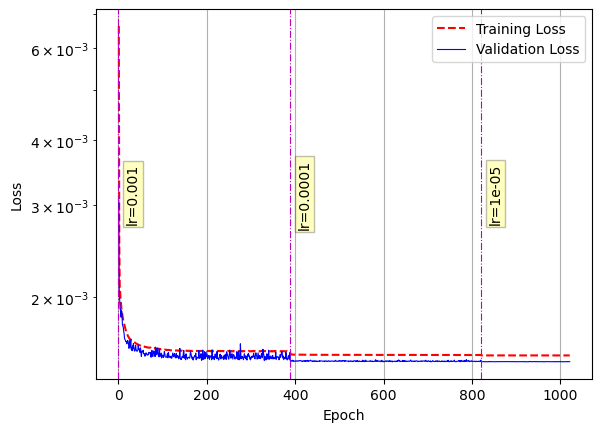

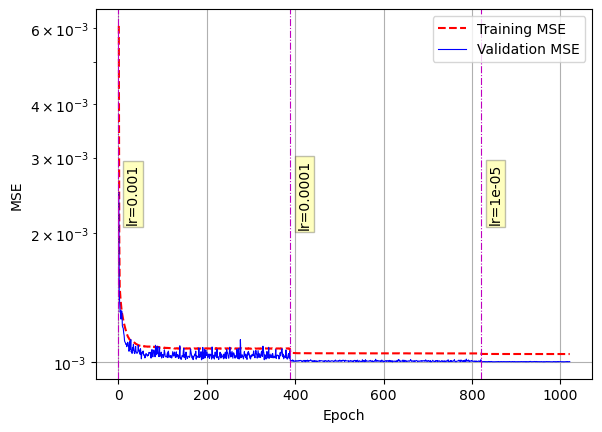

<Figure size 640x480 with 0 Axes>

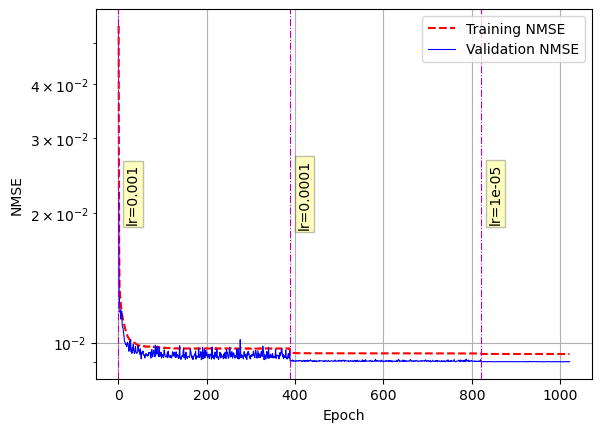

<Figure size 640x480 with 0 Axes>

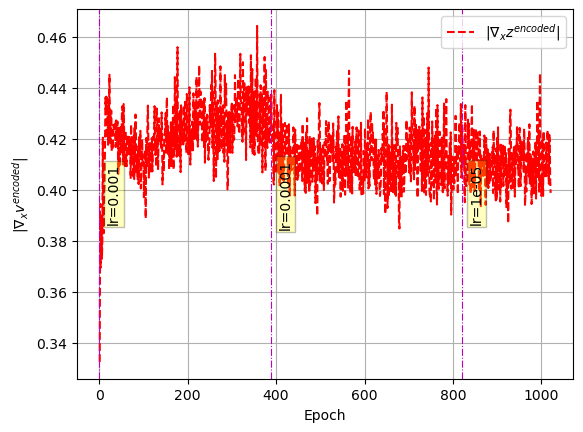

<Figure size 640x480 with 0 Axes>

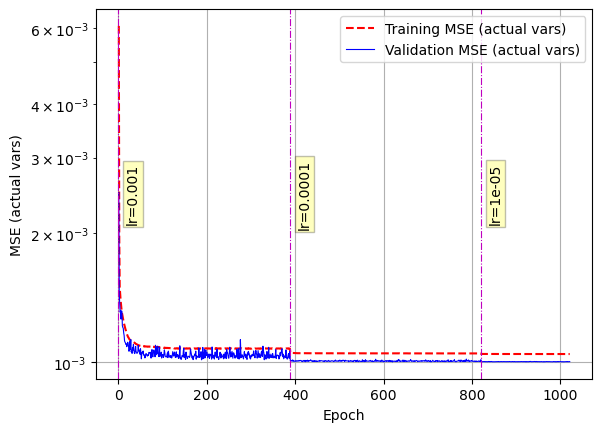

<Figure size 640x480 with 0 Axes>

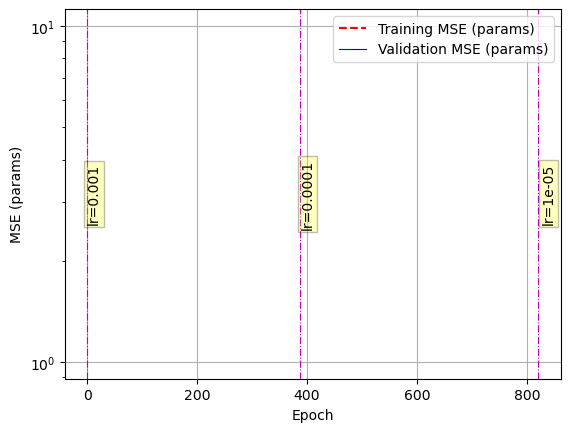

<Figure size 640x480 with 0 Axes>

In [39]:
# plotting losses
dir_name_plot = dir_name_ae + '/plots'
if not os.path.isdir(dir_name_plot):
    os.makedirs(dir_name_plot)

# Visualize loss history
fig, ax = plot_losses(
    training_loss=train_loss_hist,
    val_loss=val_loss_hist,
    lr_change=lr_change,
    learning_rate_list=learning_rate_list
)

plt.savefig(dir_name_plot + '{ds}loss_history.png'.format(ds=dir_sep), dpi=300, bbox_inches='tight')
plt.show()


fig, ax = plot_losses(
    training_loss=train_MSE_hist,
    val_loss=val_MSE_hist,
    lr_change=lr_change,
    learning_rate_list=learning_rate_list,
    legend_list=['Training MSE', 'Validation MSE'],
    xlabel='Epoch',
    ylabel='MSE',
)
plt.savefig(dir_name_plot+'/MSE_history.png', dpi=300, bbox_inches='tight')
plt.show()
plt.clf()


fig, ax = plot_losses(
    training_loss=train_NMSE_hist,
    val_loss=val_NMSE_hist,
    lr_change=lr_change,
    learning_rate_list=learning_rate_list,
    legend_list=['Training NMSE', 'Validation NMSE'],
    xlabel='Epoch',
    ylabel='NMSE',
)
plt.savefig(dir_name_plot+'/NMSE_history.png', dpi=300, bbox_inches='tight')
plt.show()
plt.clf()


fig, ax = plot_losses(
    training_loss=train_ls_jacobian_norm_hist,
    val_loss=None,
    lr_change=lr_change,
    learning_rate_list=learning_rate_list,
    legend_list=[r"$\| \nabla_{x} z^{encoded} \|$"],
    xlabel='Epoch',
    ylabel=r"$\| \nabla_{x} v^{encoded} \|$",
    plot_type='plot',
)
plt.savefig(dir_name_plot+'/train_ls_jacobian_norm_hist.png', dpi=300, bbox_inches='tight')
plt.show()
plt.clf()


fig, ax = plot_losses(
    training_loss=train_real_MSE_hist,
    val_loss=val_real_MSE_hist,
    lr_change=lr_change,
    learning_rate_list=learning_rate_list,
    legend_list=['Training MSE (actual vars)', 'Validation MSE (actual vars)'],
    xlabel='Epoch',
    ylabel='MSE (actual vars)',
)
plt.savefig(dir_name_plot+'/real_MSE_history.png', dpi=300, bbox_inches='tight')
plt.show()
plt.clf()


fig, ax = plot_losses(
    training_loss=train_params_MSE_hist,
    val_loss=val_params_MSE_hist,
    lr_change=lr_change,
    learning_rate_list=learning_rate_list,
    legend_list=['Training MSE (params)', 'Validation MSE (params)'],
    xlabel='Epoch',
    ylabel='MSE (params)',
)
plt.savefig(dir_name_plot+'/params_MSE_history.png', dpi=300, bbox_inches='tight')
plt.show()
plt.clf()

In [40]:
reconstructed_data = ae_net.predict(all_data)

In [41]:
plot_reconstructed_data(
    boundary_idx_arr,
    dir_name_ae,
    all_data,
    reconstructed_data,
    params_mat,
    save_figs=True)

In [42]:
# create data
latent_states_all = ae_net.encoder_net.predict(all_data)

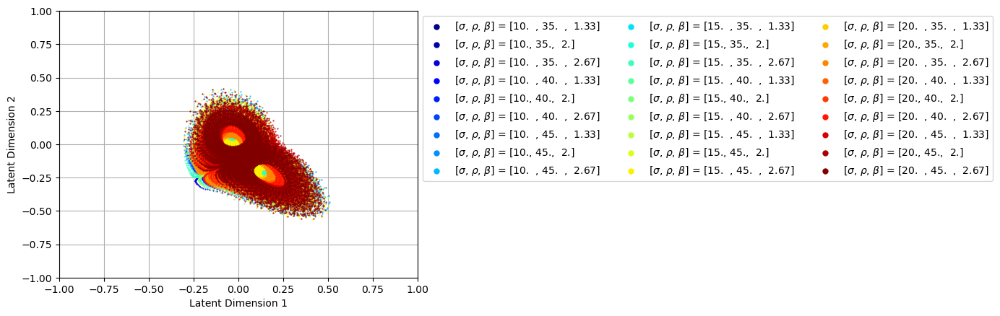

In [43]:
plot_latent_states(
    boundary_idx_arr,
    latent_states_all,
    params_mat,
    xlim=(-1, 1),
    ylim=(-1, 1),
    save_figs=True,
    dir_name_ae=dir_name_ae,
    cmap_name='jet')

In [44]:
# fig.savefig(dir_name_plot+'/latent_states.png', dpi=300, bbox_inches='tight')

In [45]:
# ae_net.summary()

# KE and Dissipation

In [46]:
if ae_net.use_weights_post_dense == True:
    print(ae_net.decoder_layers_list[-1].individual_weights)

<tf.Variable 'single_weights/individual_weights:0' shape=(3,) dtype=float32, numpy=array([1.3678416, 1.8195691, 1.6591802], dtype=float32)>
